In [39]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os

from fastai.vision.all import *
from fastai.text.all import *
from pathlib import Path

import torch
torch.cuda.empty_cache()
import torch.nn.functional as F
import torch.optim as optim
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SubsetRandomSampler
import torchvision

import torchtext
from torchtext.data import get_tokenizer   # for tokenization
from collections import Counter     # for tokenizer

import torchvision.transforms as T
import torchvision.models as models

import matplotlib.pyplot as plt
# import matplotlib.image as Image
import PIL
from PIL import Image

# for the bleu scores
from nltk.translate import bleu
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import corpus_bleu
from main import *
from model_baseline import EncoderDecoder

In [40]:
# Getting CUDA
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device :-", device)

Using device :- cuda:0


In [41]:
CAPTIONS_PATH = "Flickr_8k/captions.txt"
IMAGES_PATH = "Flickr_8k/Images/"

In [42]:
transforms = T.Compose([
    T.Resize(256),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
])

dataset = customDataset(
    image_dir = IMAGES_PATH,
    captions_file = CAPTIONS_PATH,
    transform = transforms
)

In [43]:
with open('vocab.pkl', 'wb') as file:
    pickle.dump(dataset.vocab, file)

In [44]:
validation_split = .1
shuffle_dataset = False
random_seed= 42
batch_size = 32
val_ratio = 0.1
train_loader,validator_loader = train_val_split(dataset,val_ratio,batch_size)

In [45]:
embed_size = 400
hidden_size = 512
vocab_size = len(dataset.vocab)
num_layers = 2
learning_rate = 3e-4
num_epochs = 12

In [46]:
def make_base_preds(model,val_loader,batch_size,dataset,descriptors,device):
    model.eval()

    y_true, y_pred =list(),list()

    # iterate through all the batches in validation data

    for idxx, (batch_images,batch_captions,batch_image_ids) in enumerate(iter(val_loader)):
        with torch.no_grad():

            # iterate through a batch
            for i in range(batch_size):
                
                # error handling in case of empty record
                if len(batch_captions[i:i+1])==0:
                    break
                
                img_caption = batch_captions[i:i+1][0].tolist()
                # sentence = [dataset.vocab.indexToSentence[idx] for idx in img_caption if idx != 0]

                y_true.append(descriptors[batch_image_ids[i]])

                image_feature = model.encoder(batch_images[i:i+1].to(device))


                image_pred_caption = model.decoder.generate_caption(image_feature.unsqueeze(0), vocab=dataset.vocab)

                y_pred.append(image_pred_caption)

                # predicted_sentence = ' '.join(image_pred_caption)

    
    return y_true, y_pred


In [47]:
# function to save model
def save_model_base(model):
    model_state = {
        'state_dict' : model.state_dict()
    }
    
    torch.save(model_state, 'baseline.pth')
    

In [48]:
model = EncoderDecoder(embed_size, hidden_size, vocab_size, num_layers).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.sentenceToIndex["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)


c:\Users\rprak\anaconda3\envs\temp\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\rprak\anaconda3\envs\temp\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch: 1 loss: 4.37252


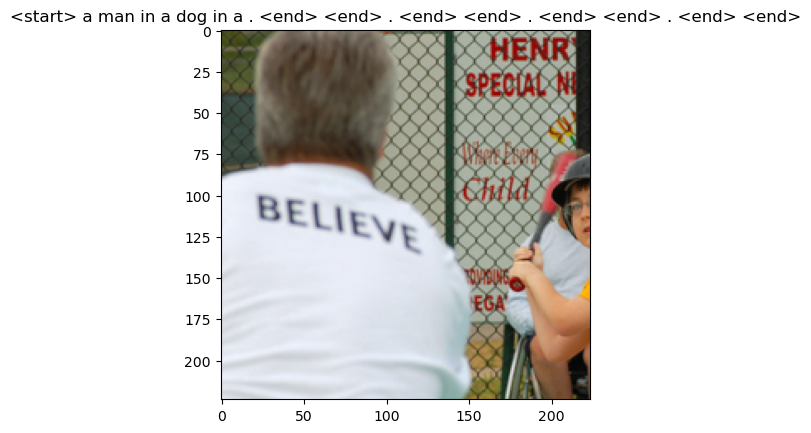

Epoch: 1 loss: 3.79055


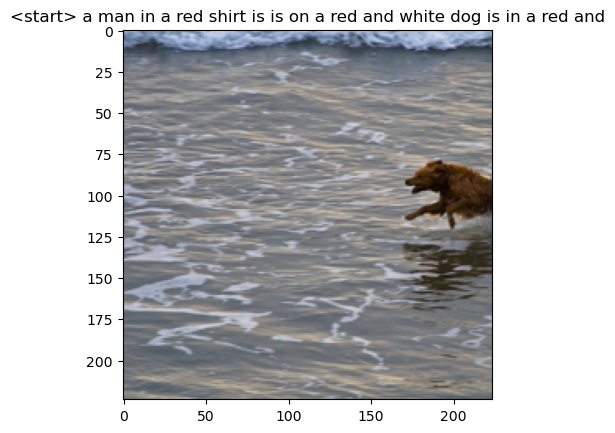

Epoch: 1 loss: 3.56454


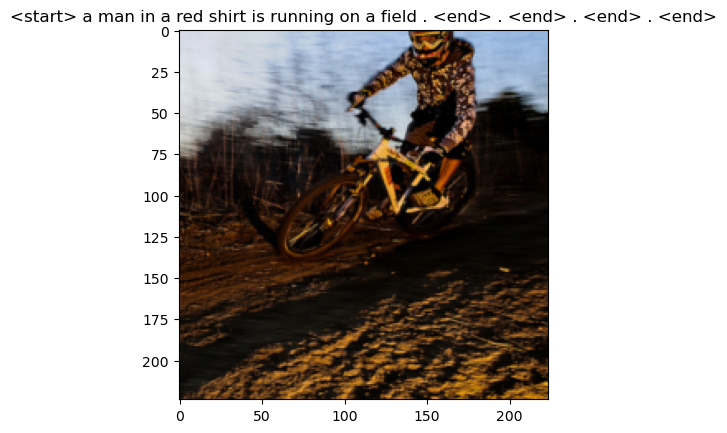

Epoch: 1 loss: 3.52401


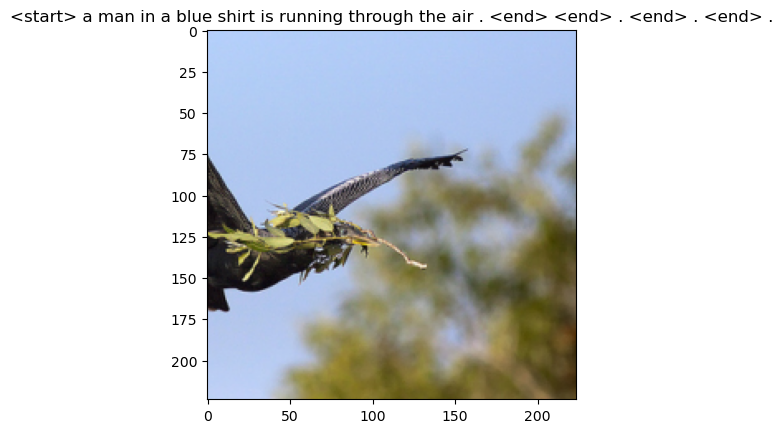

Epoch: 1 loss: 3.29933


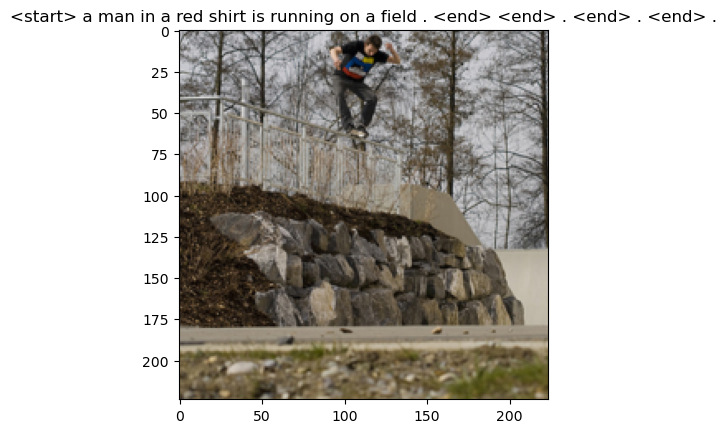

Epoch: 2 loss: 3.16462


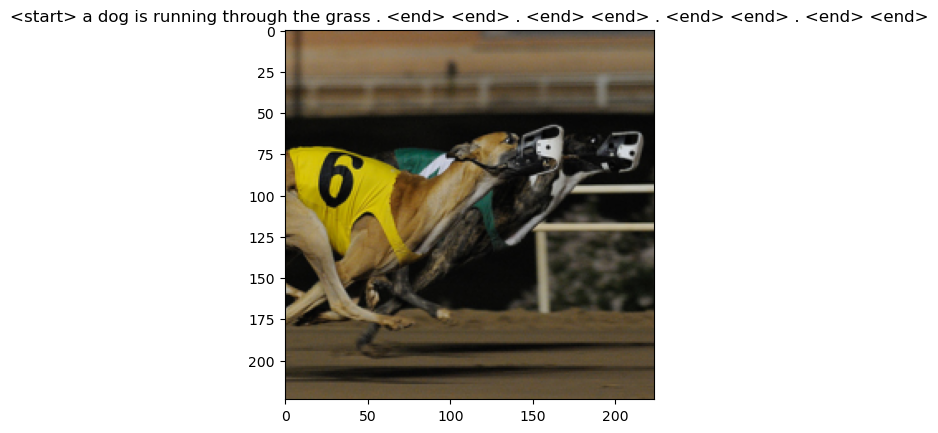

Epoch: 2 loss: 3.01846


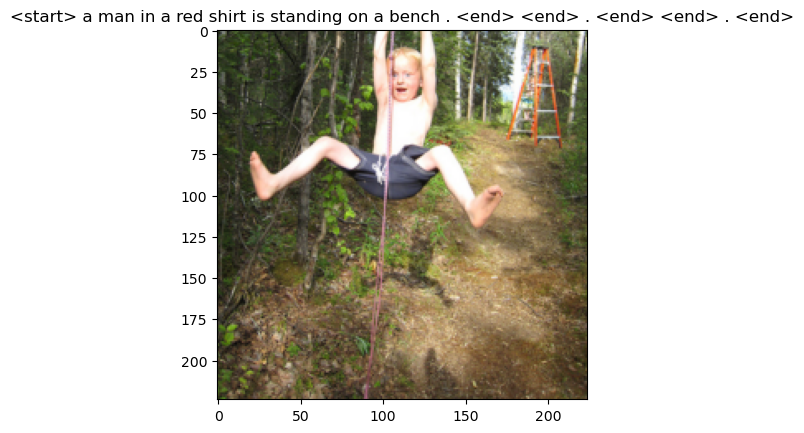

Epoch: 2 loss: 3.05018


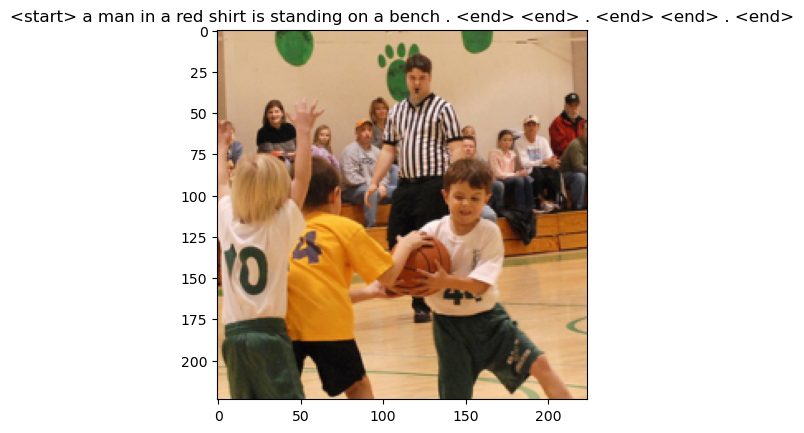

Epoch: 2 loss: 3.00326


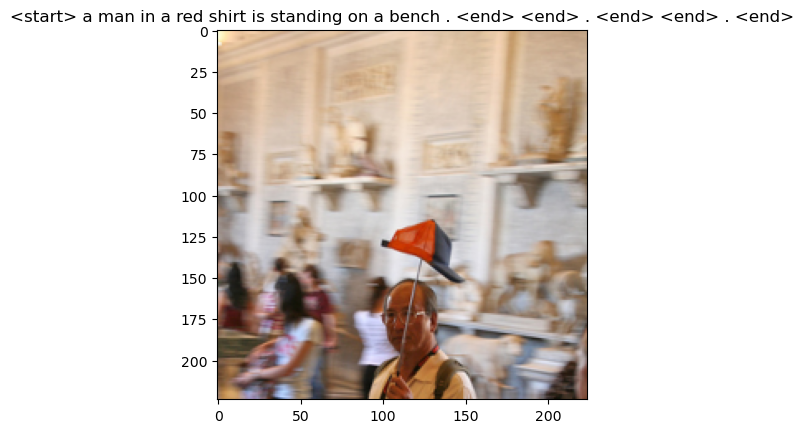

Epoch: 2 loss: 2.90223


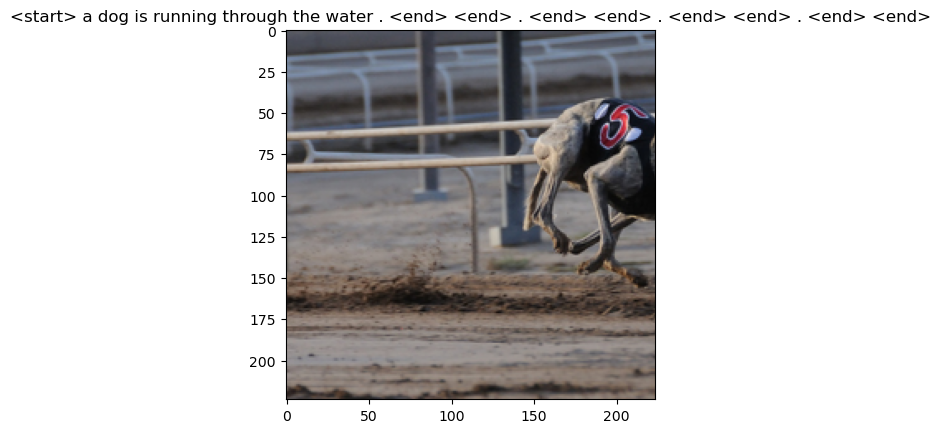

Epoch: 3 loss: 3.07507


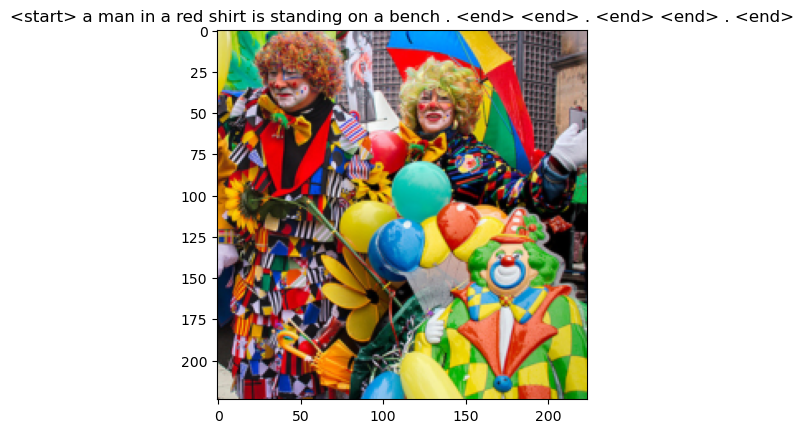

Epoch: 3 loss: 2.77585


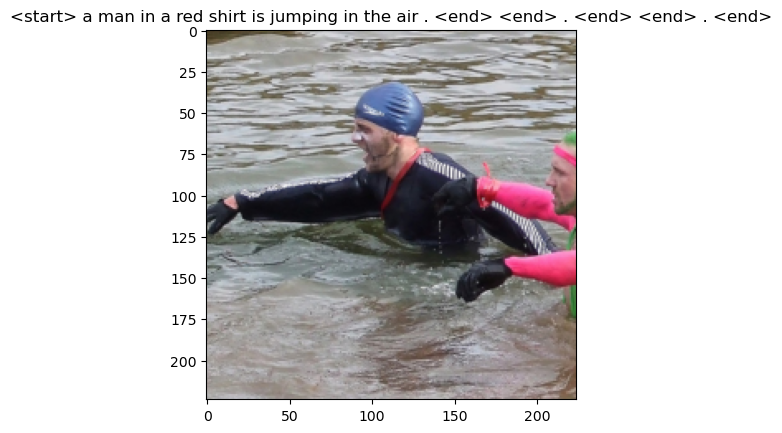

Epoch: 3 loss: 2.73232


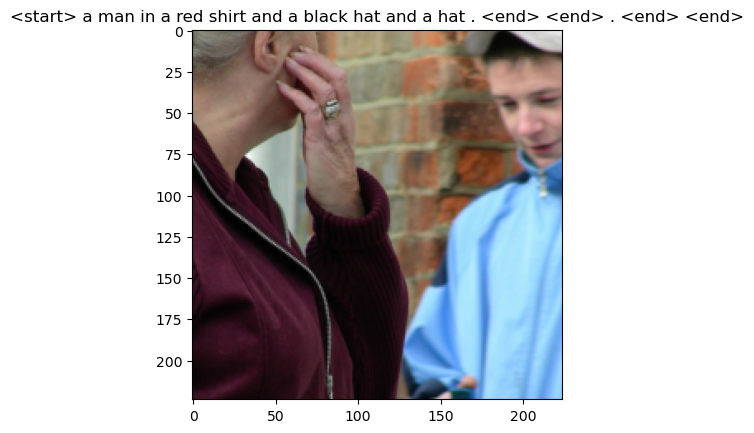

Epoch: 3 loss: 3.04684


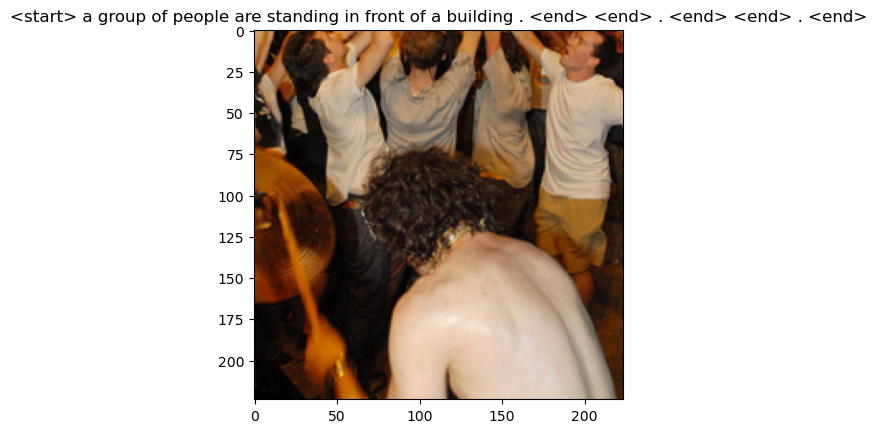

Epoch: 3 loss: 2.75041


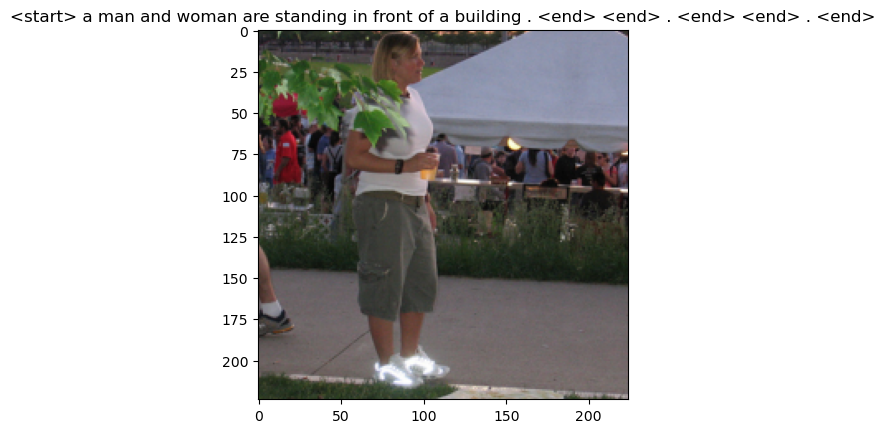

Epoch: 4 loss: 2.63049


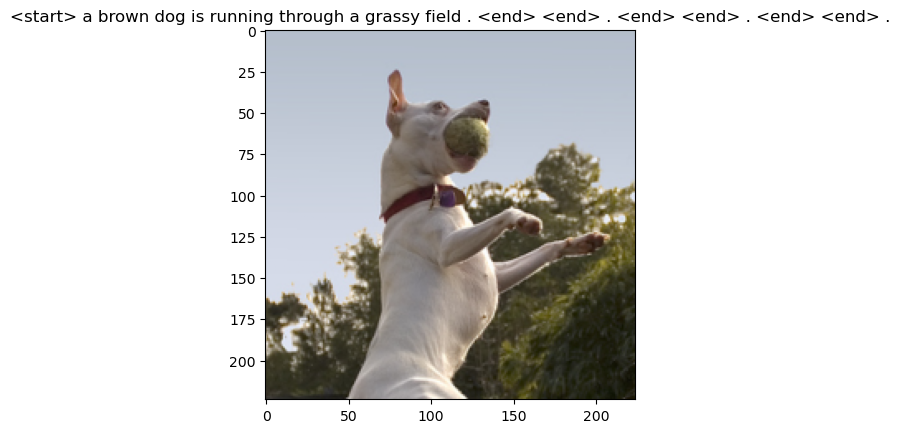

Epoch: 4 loss: 2.83079


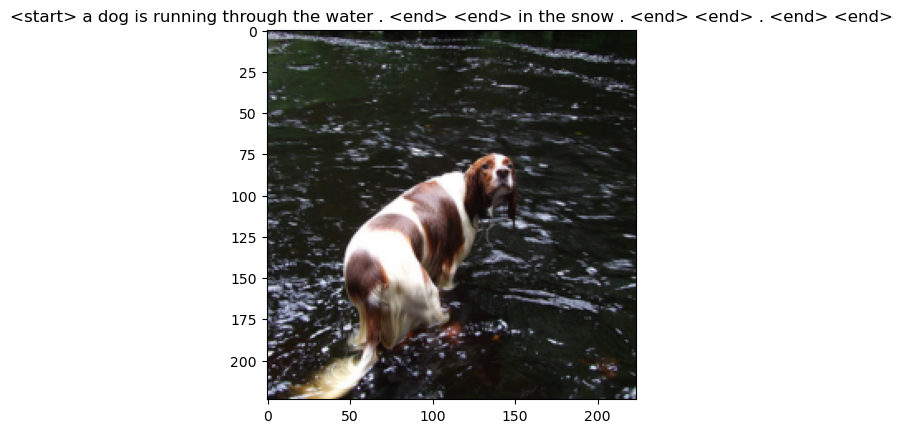

Epoch: 4 loss: 2.43997


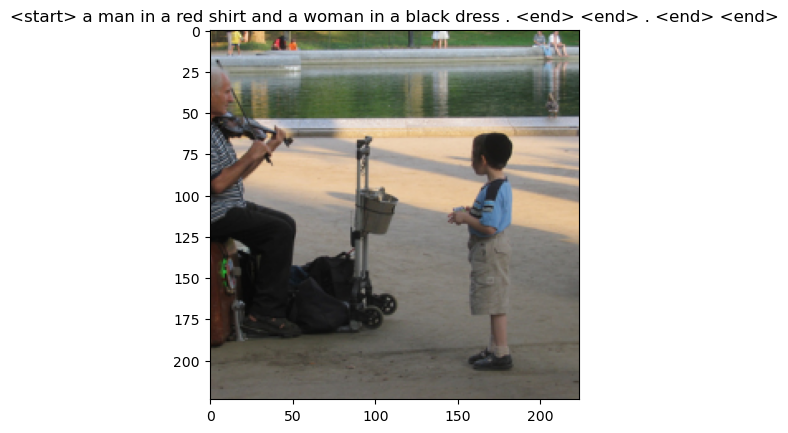

Epoch: 4 loss: 2.57191


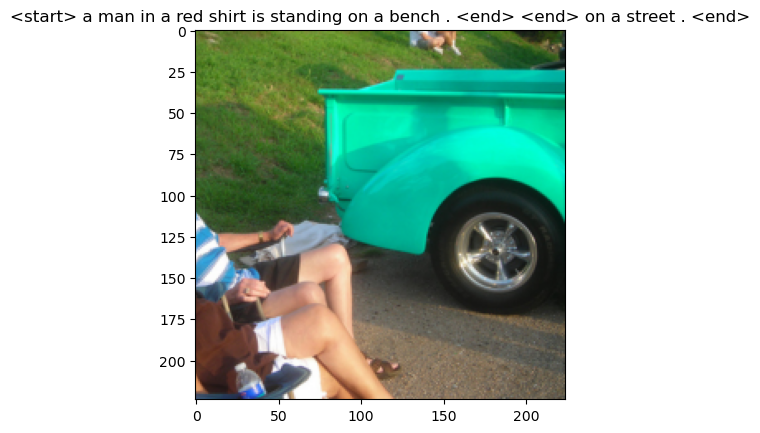

Epoch: 4 loss: 2.58784


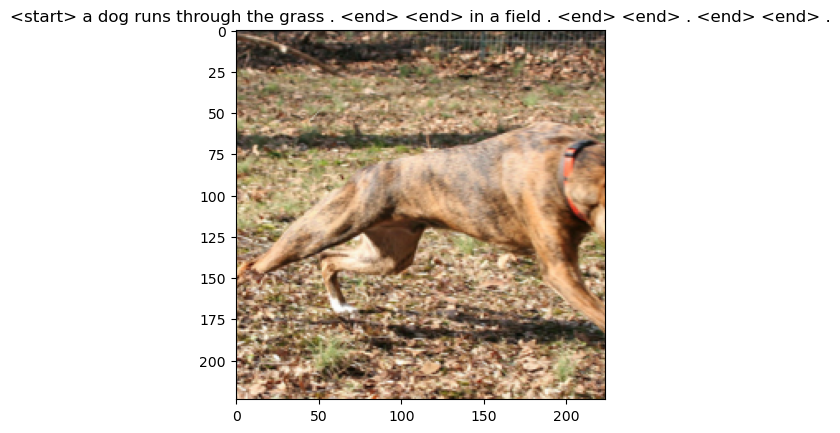

Epoch: 5 loss: 2.34832


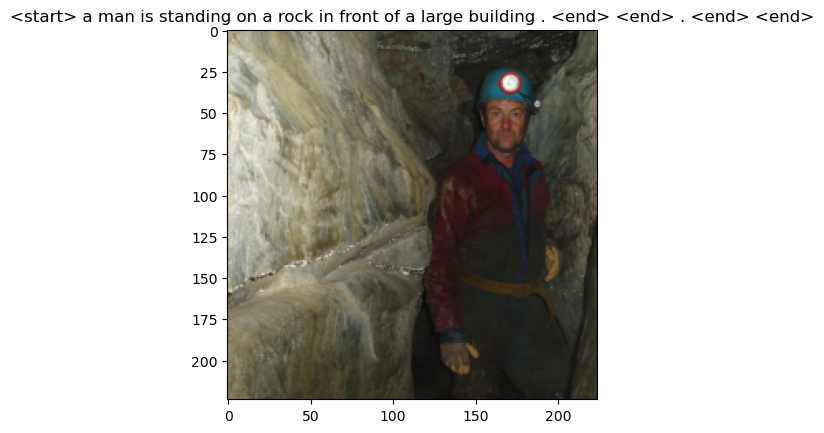

Epoch: 5 loss: 2.38424


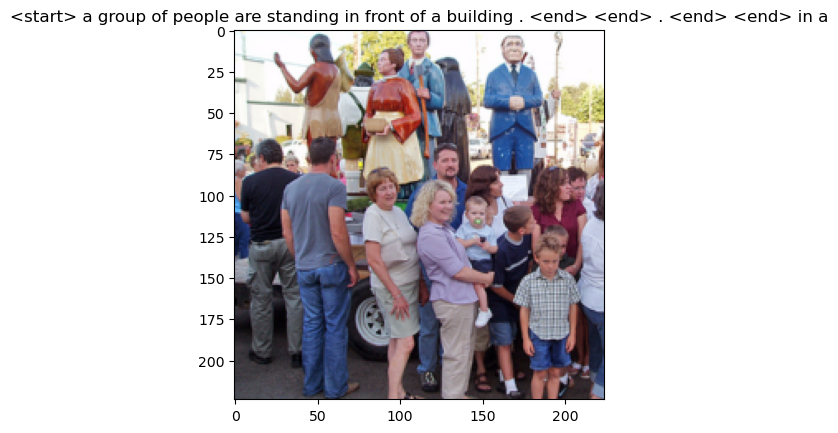

Epoch: 5 loss: 2.35653


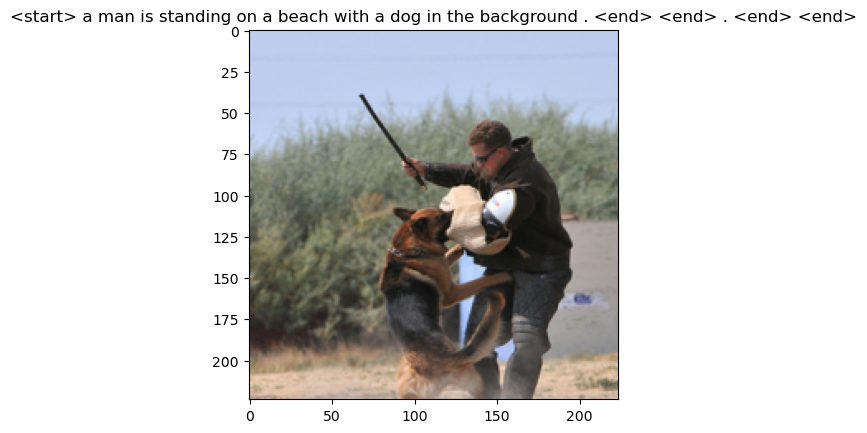

Epoch: 5 loss: 2.24220


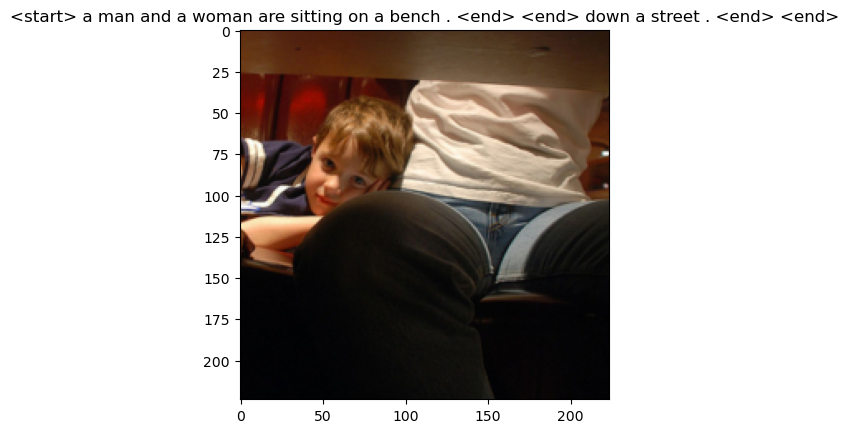

Epoch: 5 loss: 2.40178


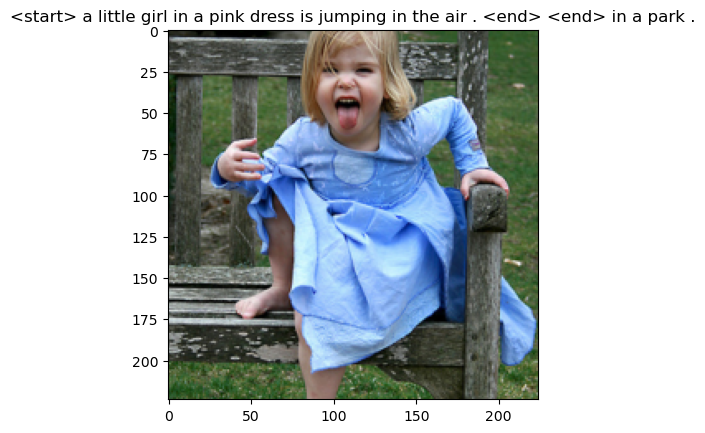

Epoch: 6 loss: 2.15774


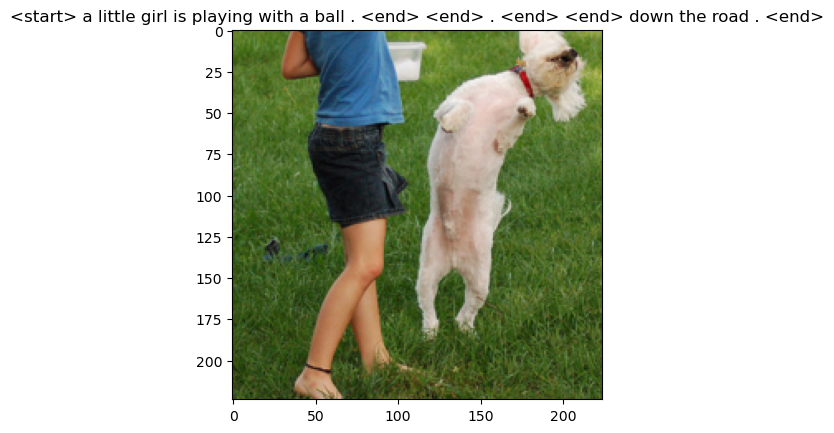

Epoch: 6 loss: 2.23207


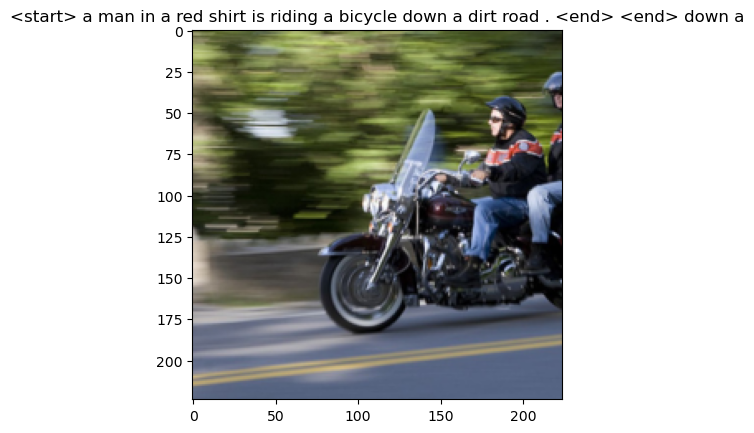

Epoch: 6 loss: 2.17665


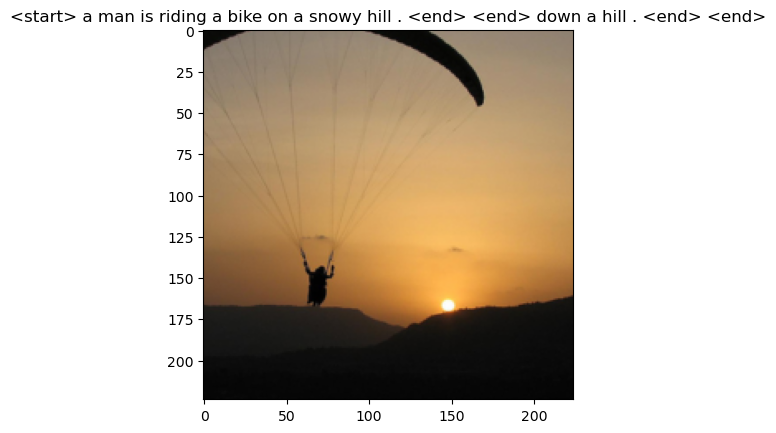

Epoch: 6 loss: 2.34737


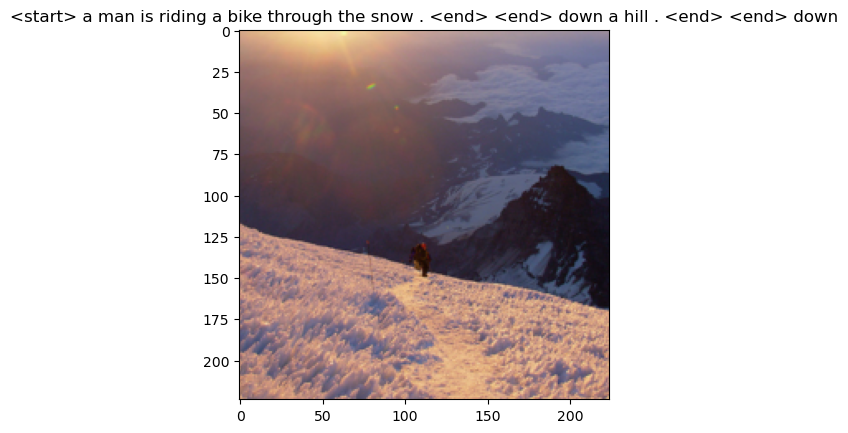

Epoch: 6 loss: 2.43964


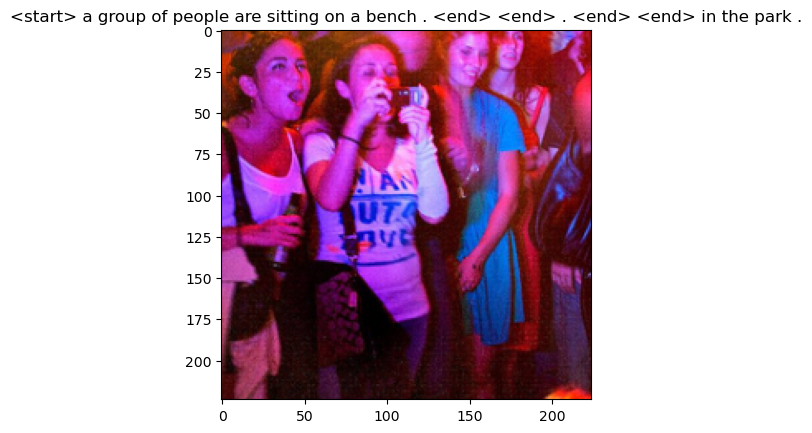

Epoch: 7 loss: 2.11145


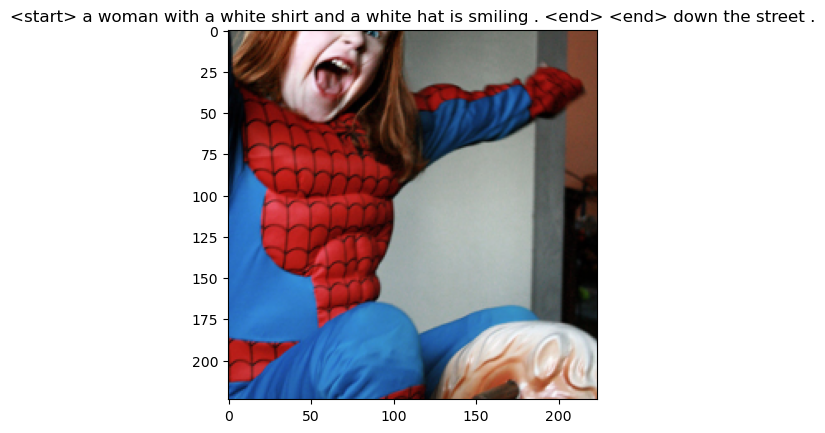

Epoch: 7 loss: 2.24647


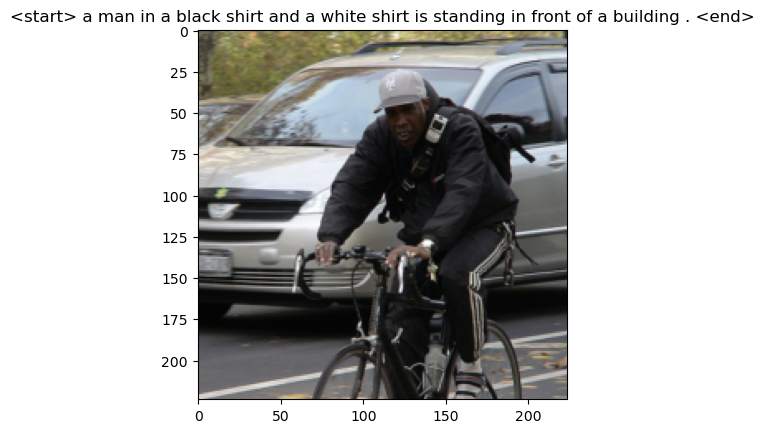

Epoch: 7 loss: 2.06164


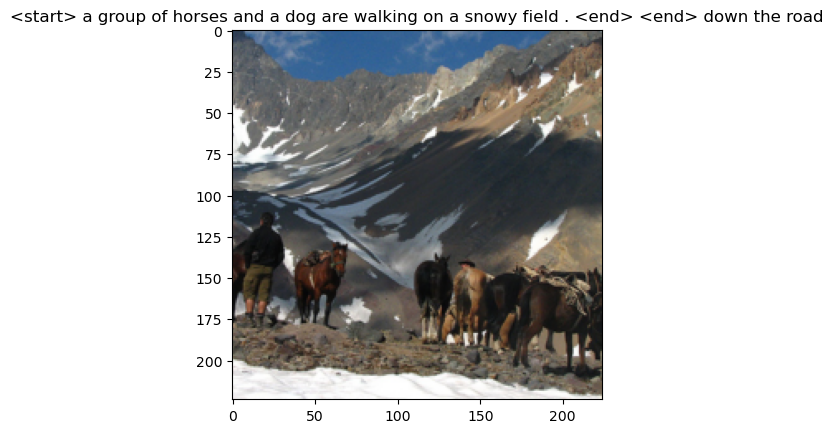

Epoch: 7 loss: 2.24727


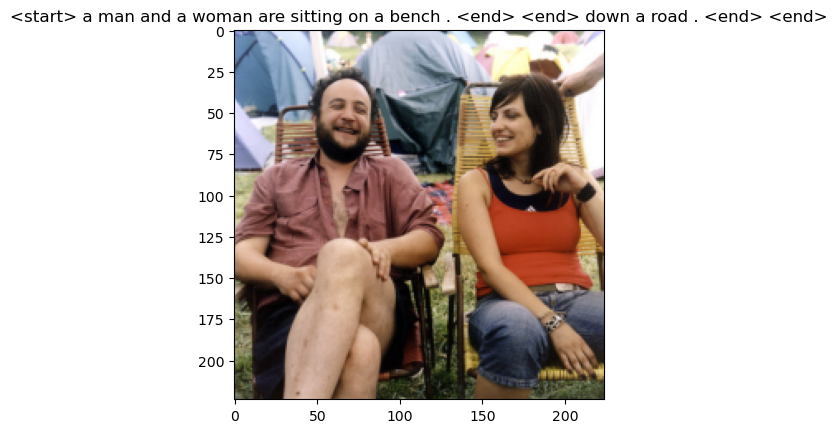

Epoch: 7 loss: 2.18155


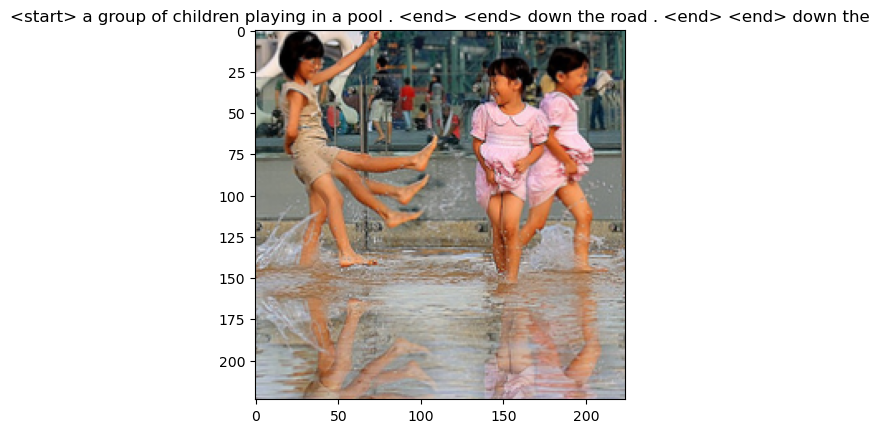

Epoch: 8 loss: 2.14983


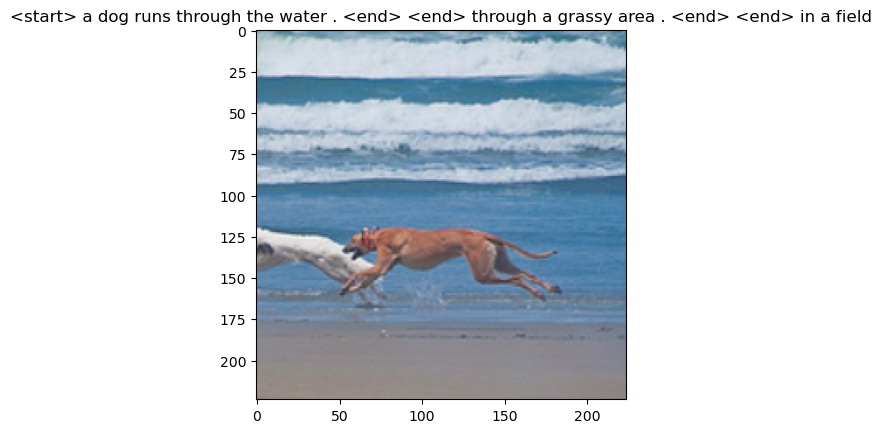

Epoch: 8 loss: 2.17542


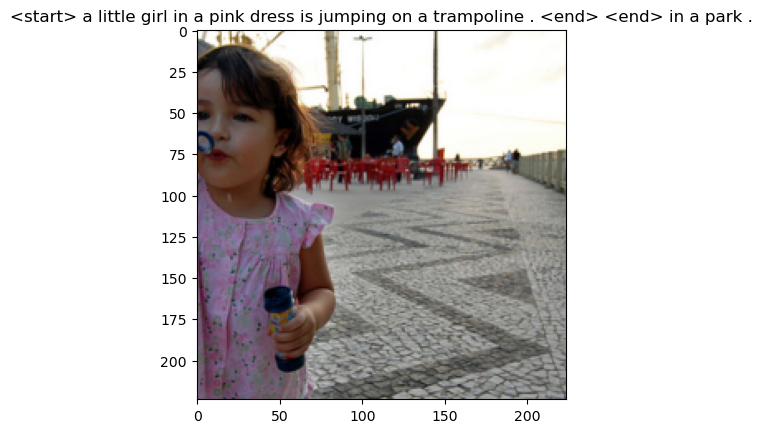

Epoch: 8 loss: 2.01649


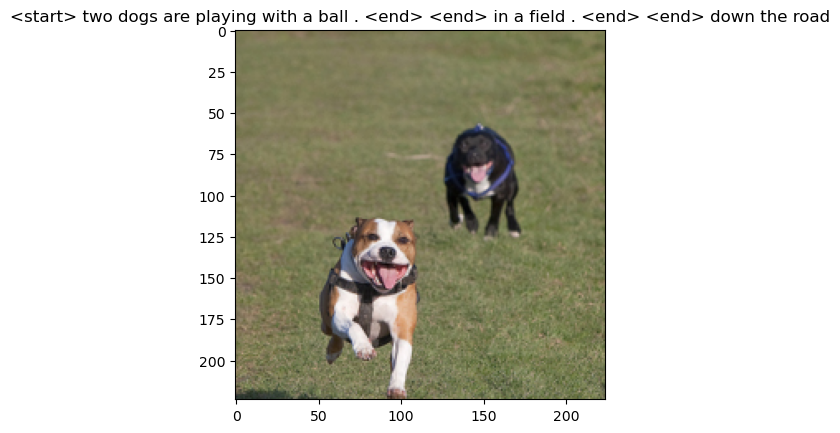

Epoch: 8 loss: 1.98579


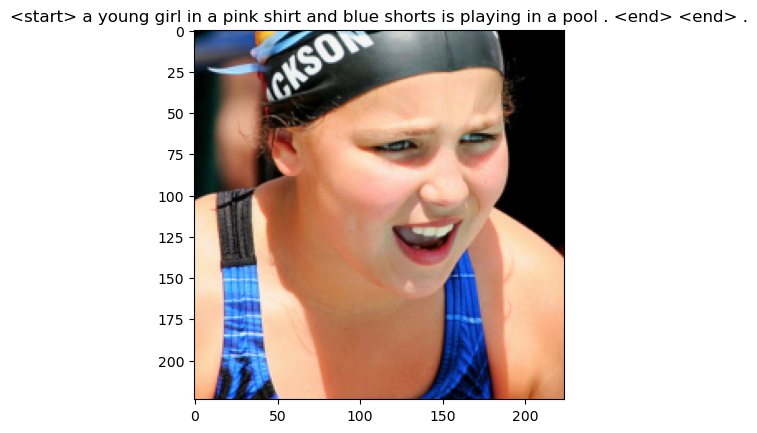

Epoch: 8 loss: 2.10848


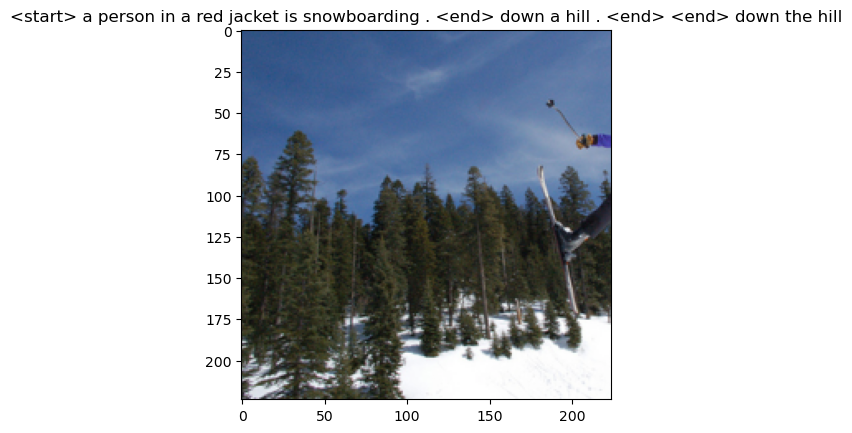

Epoch: 9 loss: 1.78058


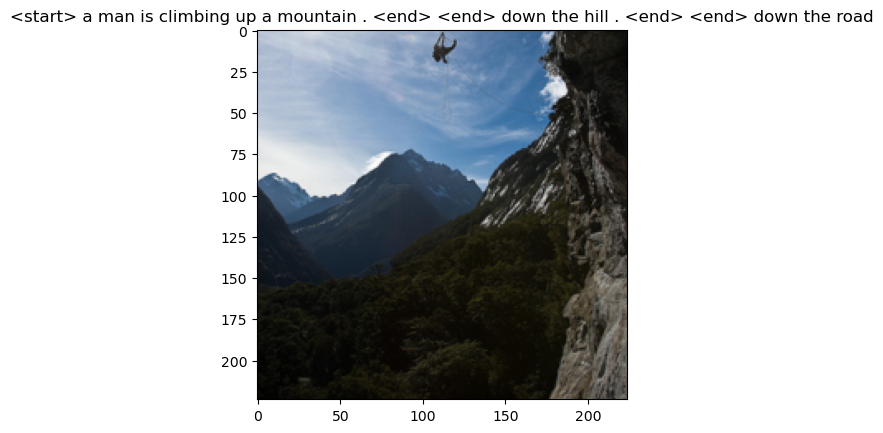

Epoch: 9 loss: 2.04864


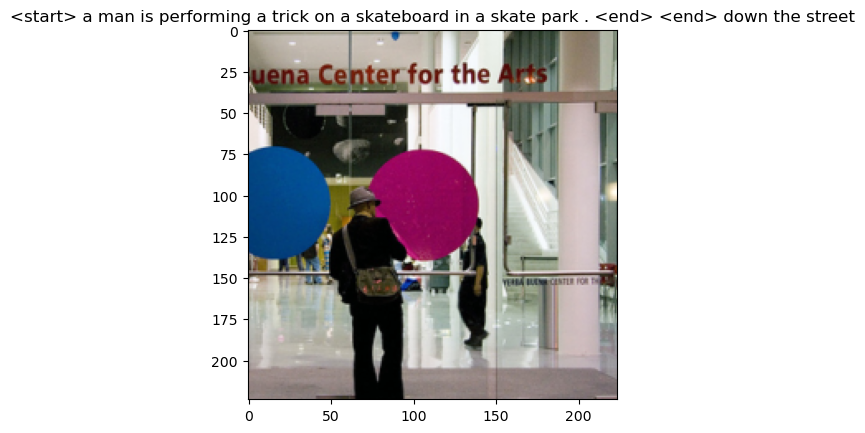

Epoch: 9 loss: 2.07398


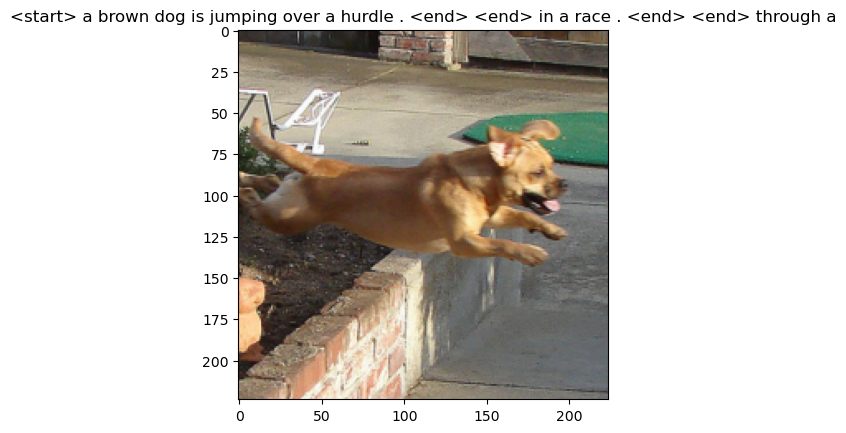

Epoch: 9 loss: 1.90626


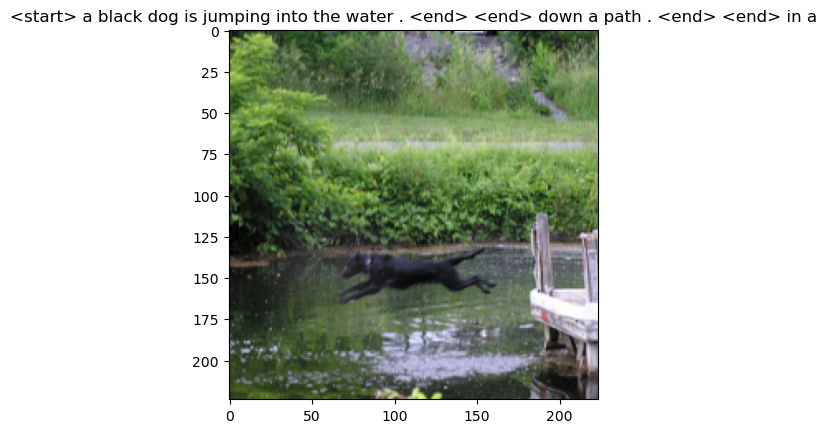

Epoch: 9 loss: 2.22590


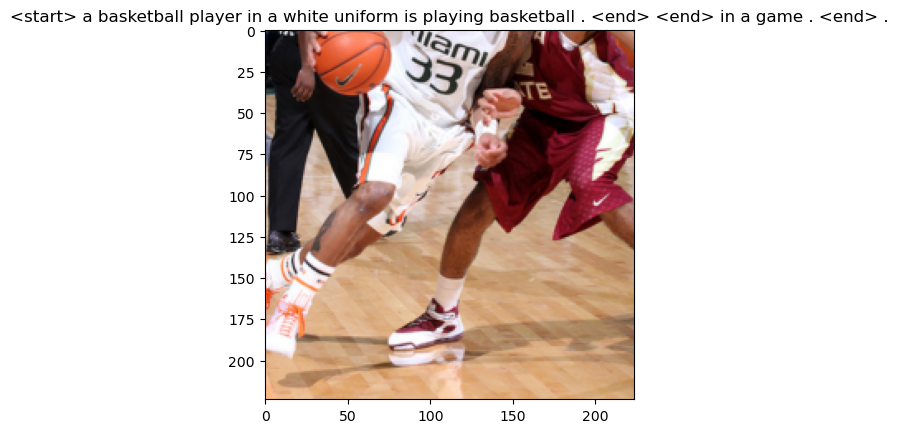

Epoch: 10 loss: 1.76193


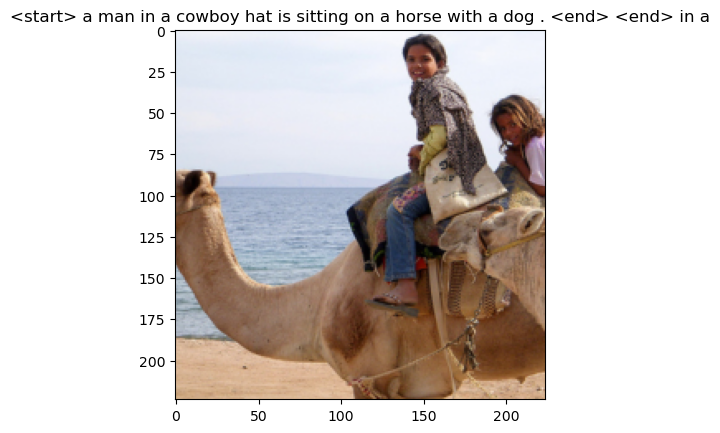

Epoch: 10 loss: 2.09240


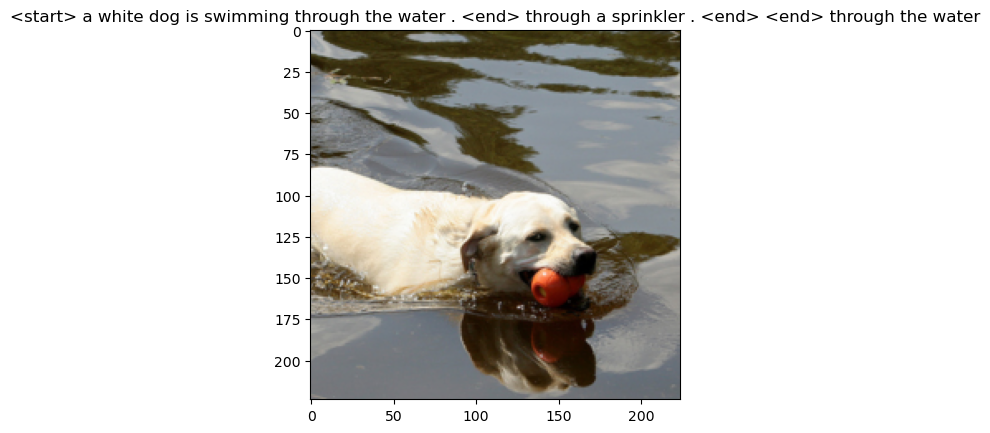

Epoch: 10 loss: 1.91221


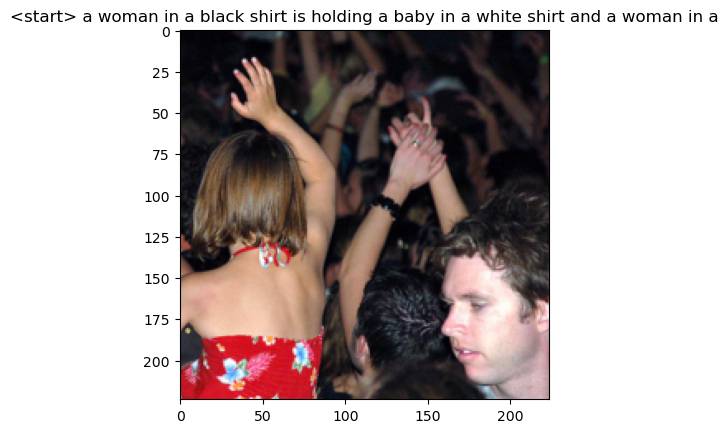

Epoch: 10 loss: 1.90364


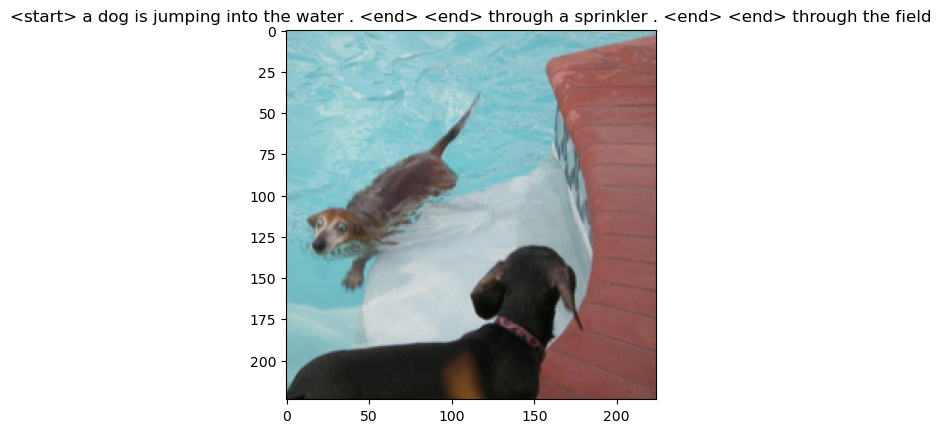

Epoch: 10 loss: 1.89988


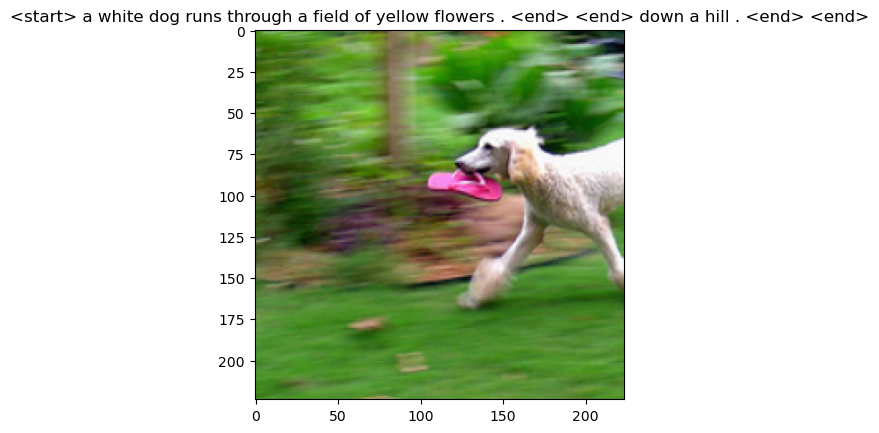

Epoch: 11 loss: 1.67739


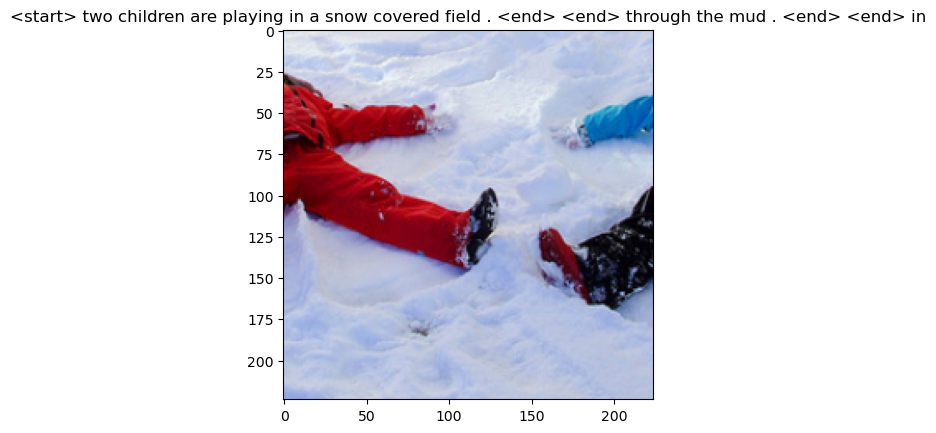

Epoch: 11 loss: 1.96103


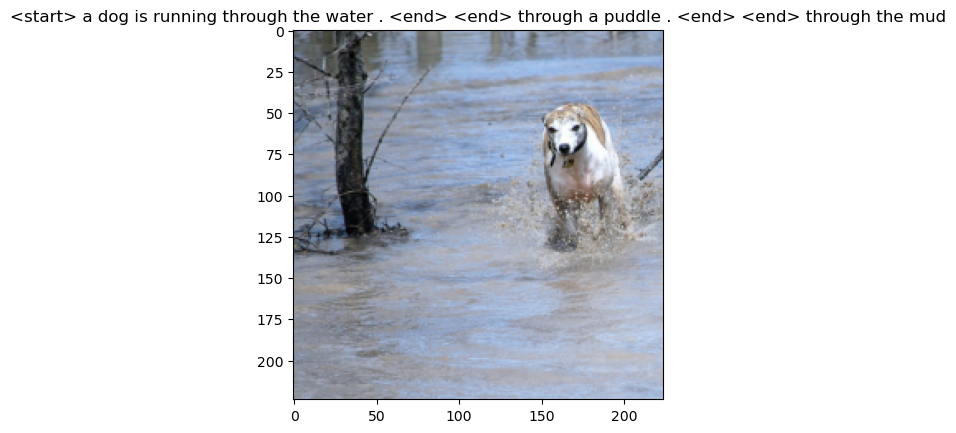

Epoch: 11 loss: 1.86587


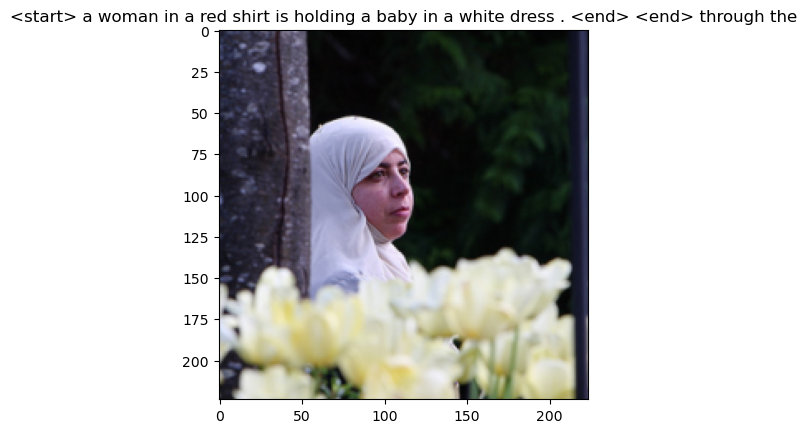

Epoch: 11 loss: 1.95225


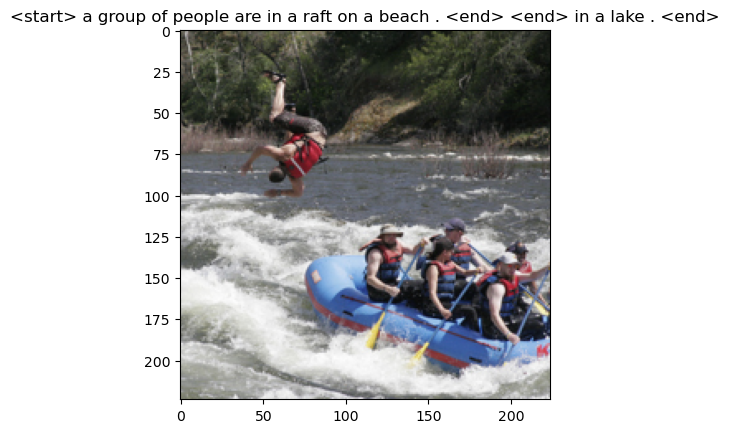

Epoch: 11 loss: 1.82718


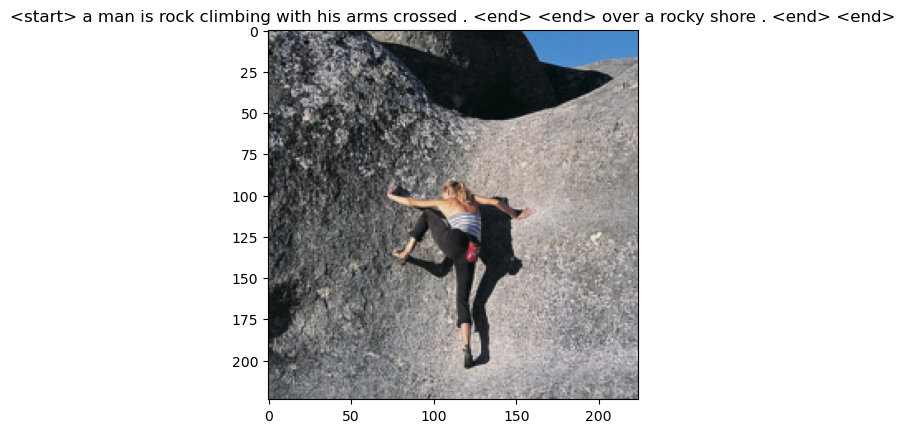

Epoch: 12 loss: 1.72618


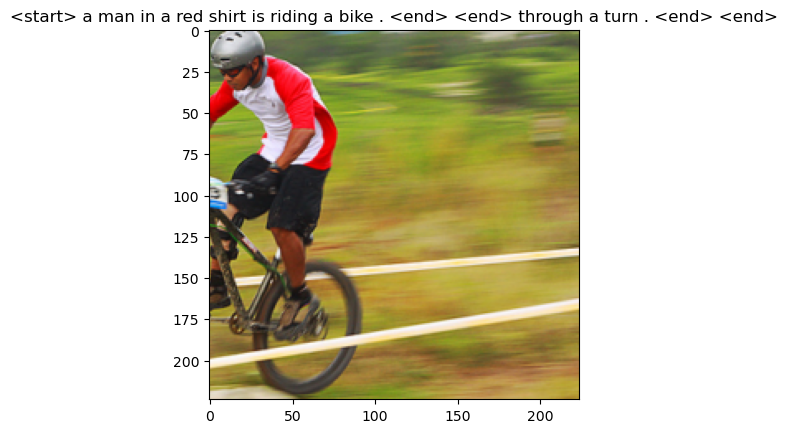

Epoch: 12 loss: 1.77102


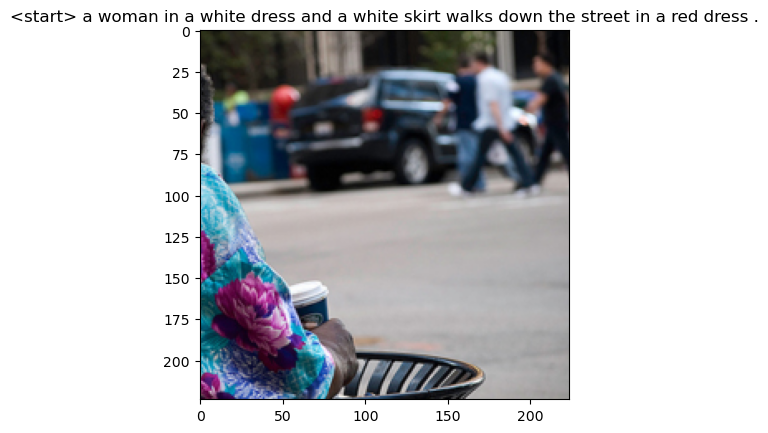

Epoch: 12 loss: 1.70081


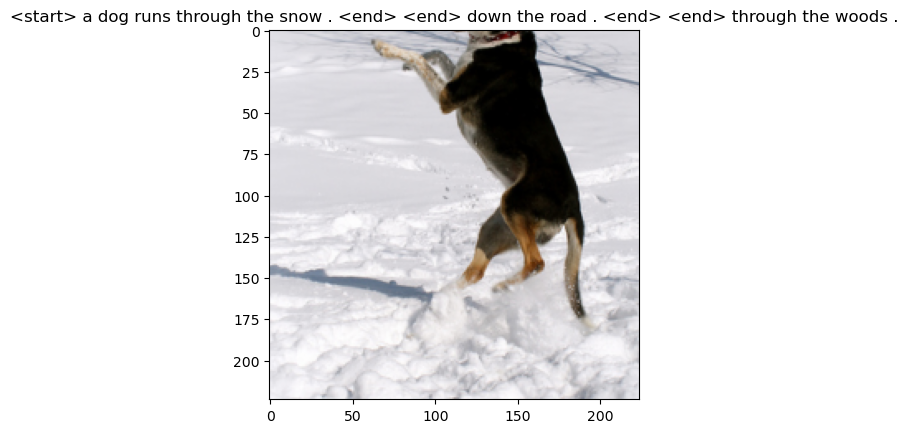

Epoch: 12 loss: 1.70785


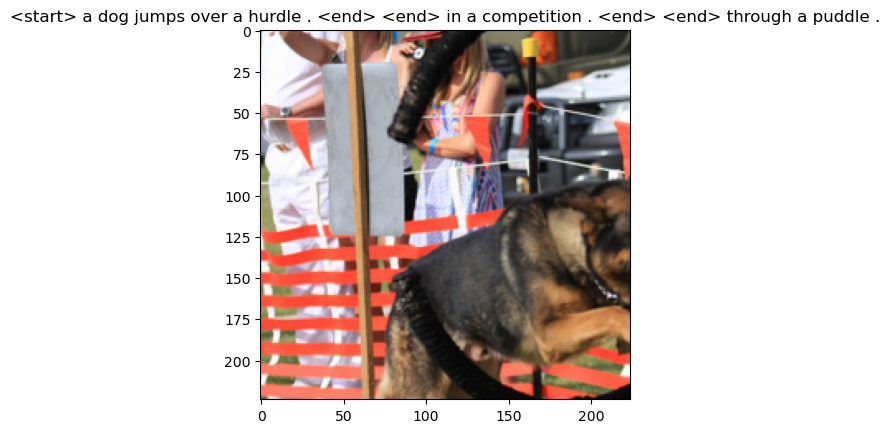

Epoch: 12 loss: 1.63515


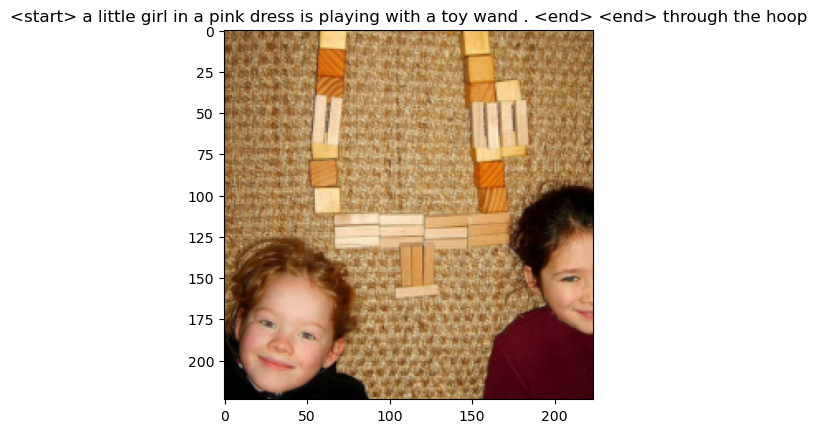

In [49]:
print_every =200
for epoch in range(1,num_epochs+1):   
    for idx, (image, captions,img_ids) in enumerate(iter(train_loader)):
        image,captions = image.to(device),captions.to(device)

        # Zero the gradients.
        optimizer.zero_grad()

        # Feed forward
        outputs = model(image, captions)
        
        # Calculate the batch loss.
        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))

        
        # Backward pass.
        loss.backward()

        # Update the parameters in the optimizer.
        optimizer.step()
        
        if (idx+1)%print_every == 0:
            print("Epoch: {} loss: {:.5f}".format(epoch,loss.item()))
            
            
            #generate the caption
            model.eval()
            with torch.no_grad():
                dataiter = iter(train_loader)
                img,_,_ = next(dataiter)
                features = model.encoder(img[0:1].to(device))
                caps = model.decoder.generate_caption(features.unsqueeze(0),vocab=dataset.vocab)
                caption = ' '.join(caps)
                show_image(img[0],title=caption)
                
            model.train()
    save_model_base(model)

In [50]:
Model_path = './baseline.pth'
model = load_model(Model_path,model)
descriptors = getDescriptors(CAPTIONS_PATH)


No of captions: 40455


In [51]:
y_true,y_pred = make_base_preds(model,validator_loader,batch_size,dataset,descriptors,device)

In [52]:
print(y_true[0])

[['<start>', 'A', 'girl', 'in', 'a', 'red', 'and', 'black', 'leotard', 'with', 'white', 'writing', 'is', 'standing', 'next', 'to', 'a', 'man', 'in', 'a', 'cap', 'and', 'a', 'girl', 'in', 'a', 'hot', 'pink', 'and', 'black', 'and', 'white', 'checkered', 'outfit', '.', '<end>'], ['<start>', 'A', 'man', 'has', 'his', 'arms', 'around', 'two', 'women', 'who', 'are', 'posing', 'for', 'a', 'picture', 'with', 'him', '.', '<end>'], ['<start>', 'A', 'man', 'with', 'a', 'backpack', 'and', 'cap', 'posing', 'with', 'two', 'girls', 'dressed', 'in', 'tight', 'uniforms', '.', '<end>'], ['<start>', 'Two', 'blonde', 'models', 'pose', 'with', 'a', 'man', 'under', 'an', 'umbrella', '.', '<end>'], ['<start>', 'Two', 'woman', 'posing', 'with', 'a', 'guy', '.', '<end>']]


In [53]:
print(y_pred[0])

['<start>', 'a', 'man', 'in', 'a', 'white', 'shirt', 'and', 'a', 'woman', 'in', 'a', 'white', 'shirt', 'and', 'blue', 'jeans', 'are', 'walking', 'down']


In [54]:
calc_BLEU_score(y_true,y_pred)

BLEU-1: 0.468554
BLEU-2: 0.298233
BLEU-3: 0.209493
BLEU-4: 0.109764


In [55]:
calc_meteor_score(y_true,y_pred)

Meteor score:  0.43133329399957926
